<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I8kDikouqpH4hf7JBiSYAeNT2IO52T-T" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Generative adversarial networks</b></h3>



В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [9]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://www.kaggle.com/datasets/tommykamaz/faces-dataset-small?resource=download-directory) и  [здесь](https://drive.google.com/drive/folders/14H7LQWzd09SaM11oLfGtd455sWH2rmRW?usp=share_link)

Давайте загрузим наши изображения. Напишите функцию, которая строит DataLoader для изображений, при этом меняя их размер до нужного значения (размер 1024 слишком большой, поэтому мы рекомендуем взять размер 128 либо немного больше)

In [10]:
COLAB_SPACE = False

In [11]:
if COLAB_SPACE:
    from google.colab import drive
    drive.mount('/content/gdrive/')
    !unzip -q /content/gdrive/MyDrive/archive.zip -d dataset

In [12]:
DATA_DIR = "./dataset/"

In [13]:
def get_dataloader(image_size, batch_size):
    """
    Builds dataloader for training data.
    Use tt.Compose and tt.Resize for transformations
    :param image_size: height and wdith of the image
    :param batch_size: batch_size of the dataloader
    :returns: DataLoader object
    """

    train_ds = ImageFolder(DATA_DIR, transform=tt.Compose([
        tt.Resize(image_size),
        tt.CenterCrop(image_size),
        tt.ToTensor(),
        tt.Normalize(*stats)])
    )

    train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)
    return train_dl

In [14]:
image_size = 128
batch_size = 32
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

train_loader = get_dataloader(image_size, batch_size)

In [15]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [16]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach().cpu()[:nmax]), nrow=8).permute(1, 2, 0))
    plt.show()

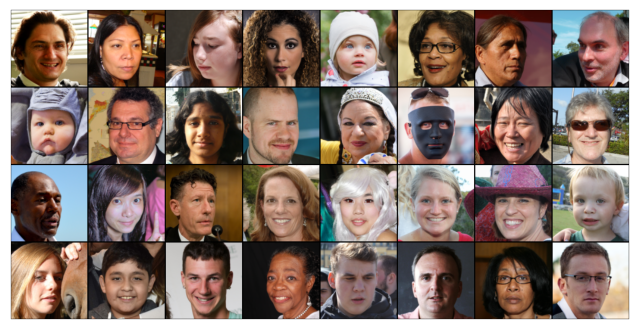

In [17]:
for images, _ in train_loader:
    show_images(images)
    break

## Часть 2. Построение и обучение модели (2 балла)

Сконструируйте генератор и дискриминатор. Помните, что:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

In [18]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [19]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

In [20]:
train_loader = DeviceDataLoader(train_loader, device)

In [21]:
discriminator = nn.Sequential(
    # in: 3 x 128 x 128

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 64 x 64

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 32 x 32

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 16 x 16

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 8 x 8

    nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(1024),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 1024 x 4 x 4

    nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [22]:
discriminator = to_device(discriminator, device)

In [23]:
latent_size = 128

In [24]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(32),
    nn.ReLU(True),
    # out: 128 x 64 x 64

    nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 128 x 128
)

In [25]:
generator = to_device(generator, device)

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь берем бинарную кросс-энтропию

In [26]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [27]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

In [70]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(denorm(fake_images).cpu().detach(), nrow=8).permute(1, 2, 0))
        plt.show()

In [51]:
def train(model, train_loader, criterion, lr, epochs, start_idx=1):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(),
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999))
    }

    scheduler = {
        "discriminator": torch.optim.lr_scheduler.StepLR(optimizer["discriminator"], step_size=40, gamma=0.5),
        "generator": torch.optim.lr_scheduler.StepLR(optimizer["generator"], step_size=40, gamma=0.5),
    }

    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images, _ in tqdm(train_loader):
            # Train discriminator
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()

            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images)
            real_targets = torch.ones(real_images.size(0), 1, device=device)
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()

            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Pass fake images through discriminator
            fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()

            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Try to fool the discriminator
            preds = model["discriminator"](fake_images)
            targets = torch.ones(batch_size, 1, device=device)
            loss_g = criterion["generator"](preds, targets)

            # Update generator weights
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())

        scheduler["discriminator"].step()
        scheduler["generator"].step()
        
        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs,
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))

        show_images(fake_images, nmax=8)

    return losses_g, losses_d, real_scores, fake_scores

In [30]:
model = {
    "discriminator": discriminator,
    "generator": generator
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}
lr = 0.0002
epochs = 100

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 14.0511, loss_d: 0.3576, real_score: 0.9418, fake_score: 0.0871


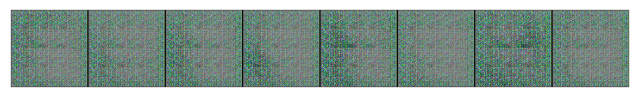

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 9.3360, loss_d: 0.1071, real_score: 0.9715, fake_score: 0.0406


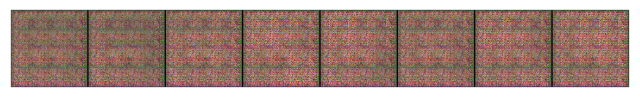

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 9.3239, loss_d: 0.3715, real_score: 0.9285, fake_score: 0.0726


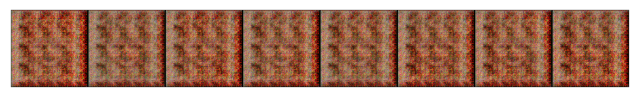

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 7.8305, loss_d: 0.5585, real_score: 0.8860, fake_score: 0.0987


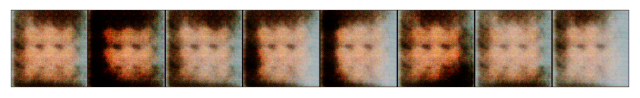

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 3.8062, loss_d: 0.6066, real_score: 0.8330, fake_score: 0.1647


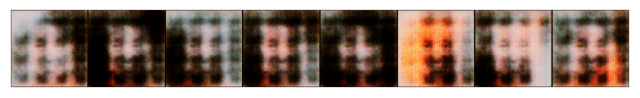

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 5.5161, loss_d: 0.4068, real_score: 0.8847, fake_score: 0.1189


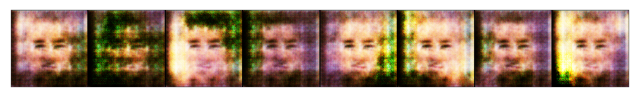

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 5.5886, loss_d: 0.5676, real_score: 0.8367, fake_score: 0.1646


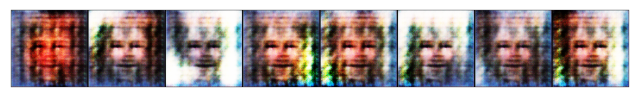

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 5.5679, loss_d: 0.5588, real_score: 0.8445, fake_score: 0.1620


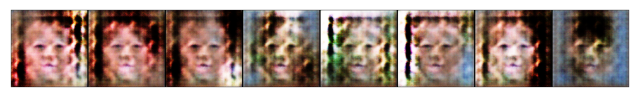

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 5.1751, loss_d: 0.6842, real_score: 0.8121, fake_score: 0.1855


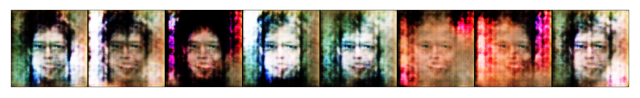

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 5.1503, loss_d: 0.6694, real_score: 0.8150, fake_score: 0.1871


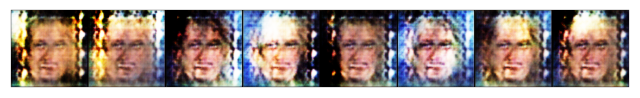

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 5.0382, loss_d: 0.7144, real_score: 0.7999, fake_score: 0.1968


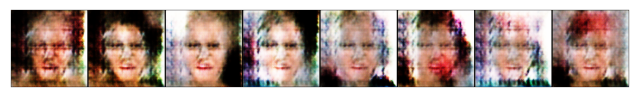

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 5.2521, loss_d: 0.6605, real_score: 0.8077, fake_score: 0.1902


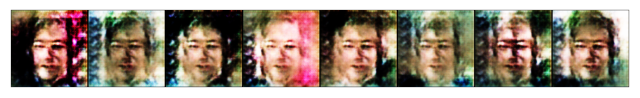

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 5.6789, loss_d: 0.6152, real_score: 0.8203, fake_score: 0.1771


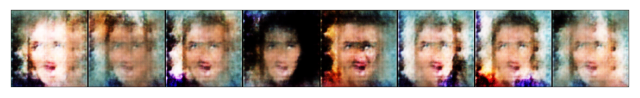

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 5.2852, loss_d: 0.5642, real_score: 0.8217, fake_score: 0.1707


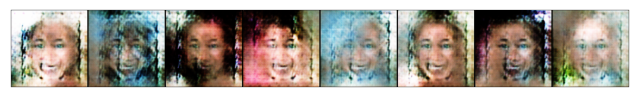

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 5.3301, loss_d: 0.6562, real_score: 0.8139, fake_score: 0.1895


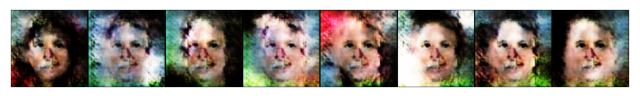

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 5.2051, loss_d: 0.6817, real_score: 0.8045, fake_score: 0.1960


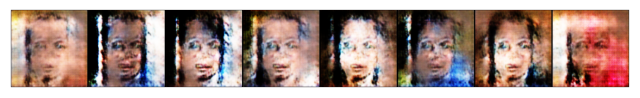

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 5.5710, loss_d: 0.6072, real_score: 0.8180, fake_score: 0.1804


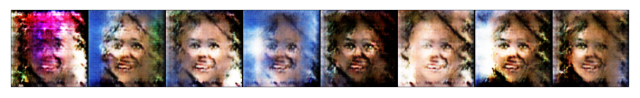

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 5.4647, loss_d: 0.5378, real_score: 0.8308, fake_score: 0.1660


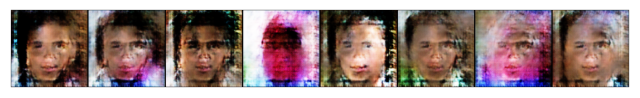

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 5.9390, loss_d: 0.5433, real_score: 0.8354, fake_score: 0.1591


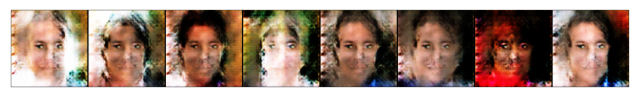

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 6.0558, loss_d: 0.5310, real_score: 0.8419, fake_score: 0.1600


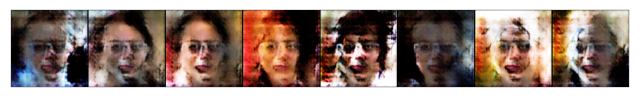

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 5.7893, loss_d: 0.5360, real_score: 0.8377, fake_score: 0.1569


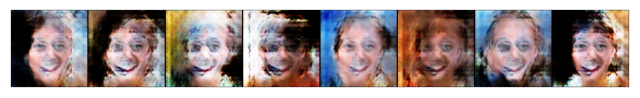

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 6.0609, loss_d: 0.4672, real_score: 0.8513, fake_score: 0.1460


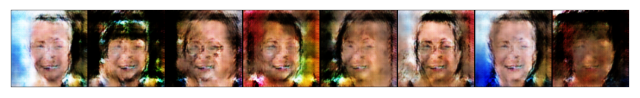

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 5.8365, loss_d: 0.4754, real_score: 0.8580, fake_score: 0.1420


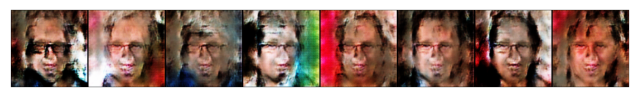

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 6.4423, loss_d: 0.4578, real_score: 0.8567, fake_score: 0.1411


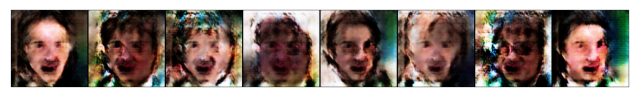

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 6.5359, loss_d: 0.4582, real_score: 0.8679, fake_score: 0.1309


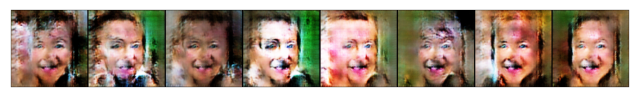

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 6.4083, loss_d: 0.4663, real_score: 0.8669, fake_score: 0.1321


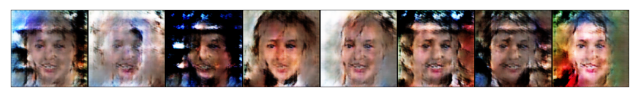

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 6.0309, loss_d: 0.3455, real_score: 0.8816, fake_score: 0.1115


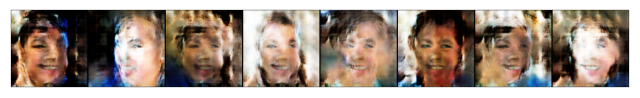

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 6.6915, loss_d: 0.4640, real_score: 0.8638, fake_score: 0.1408


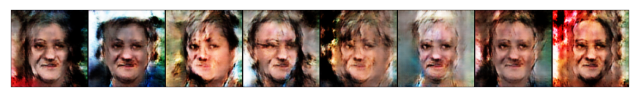

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 6.1364, loss_d: 0.3324, real_score: 0.8933, fake_score: 0.1005


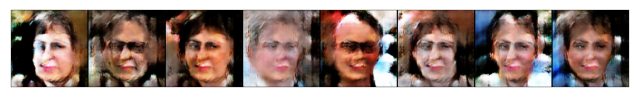

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 6.7957, loss_d: 0.3783, real_score: 0.8844, fake_score: 0.1172


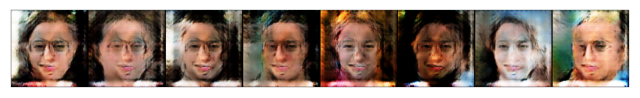

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 6.5670, loss_d: 0.4406, real_score: 0.8764, fake_score: 0.1219


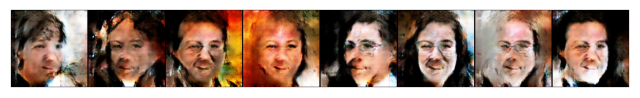

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 6.7983, loss_d: 0.3842, real_score: 0.8849, fake_score: 0.1147


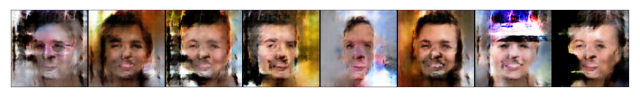

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 6.5153, loss_d: 0.3266, real_score: 0.8943, fake_score: 0.1028


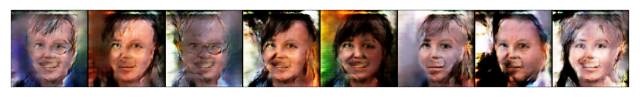

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 6.7895, loss_d: 0.4011, real_score: 0.8848, fake_score: 0.1156


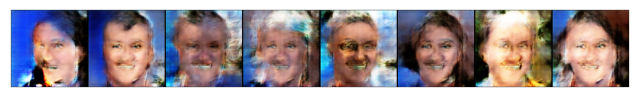

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 6.6953, loss_d: 0.3403, real_score: 0.8963, fake_score: 0.1027


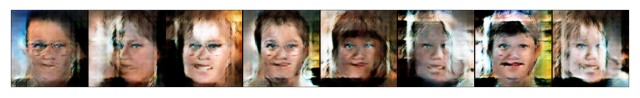

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 6.6990, loss_d: 0.4157, real_score: 0.8826, fake_score: 0.1091


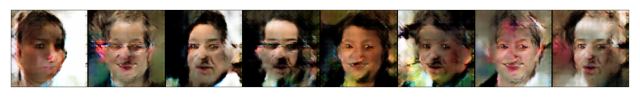

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 6.1620, loss_d: 0.3689, real_score: 0.8966, fake_score: 0.1030


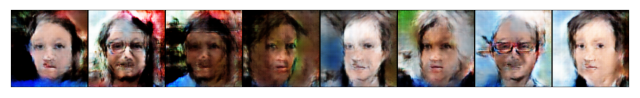

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 6.5682, loss_d: 0.2883, real_score: 0.9081, fake_score: 0.0892


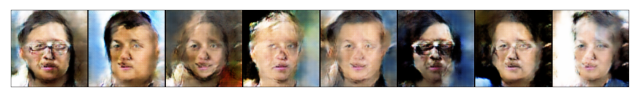

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 6.2076, loss_d: 0.3329, real_score: 0.9051, fake_score: 0.0993


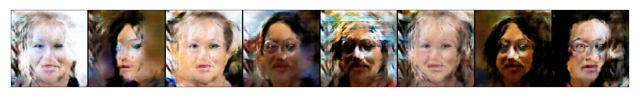

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 6.2123, loss_d: 0.2370, real_score: 0.9191, fake_score: 0.0805


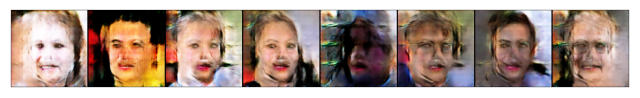

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 4.8233, loss_d: 0.1162, real_score: 0.9485, fake_score: 0.0490


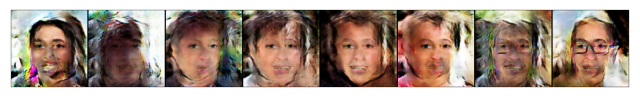

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 5.4776, loss_d: 0.1532, real_score: 0.9473, fake_score: 0.0509


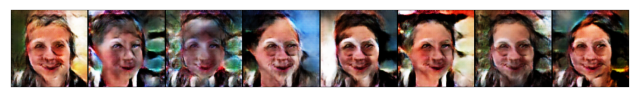

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 5.7279, loss_d: 0.0889, real_score: 0.9621, fake_score: 0.0384


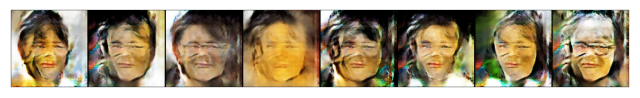

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 6.0155, loss_d: 0.0844, real_score: 0.9631, fake_score: 0.0351


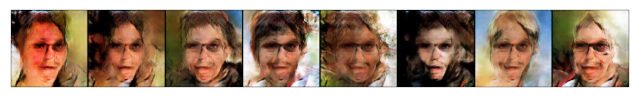

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 6.6659, loss_d: 0.1234, real_score: 0.9577, fake_score: 0.0405


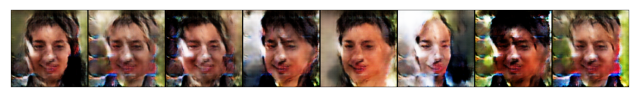

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 6.5457, loss_d: 0.0823, real_score: 0.9677, fake_score: 0.0359


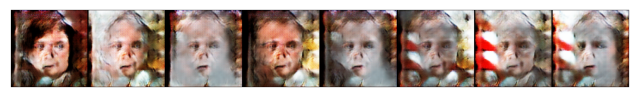

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 7.8507, loss_d: 0.0935, real_score: 0.9630, fake_score: 0.0313


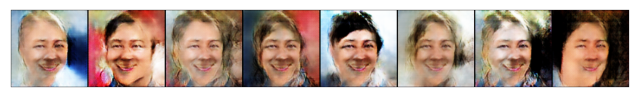

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 7.1641, loss_d: 0.1395, real_score: 0.9541, fake_score: 0.0388


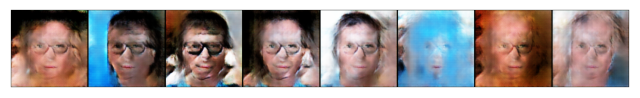

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 6.9883, loss_d: 0.1639, real_score: 0.9687, fake_score: 0.0402


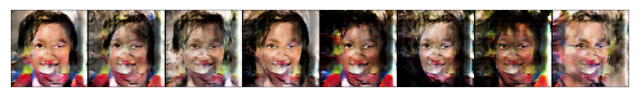

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 7.3797, loss_d: 0.0636, real_score: 0.9724, fake_score: 0.0260


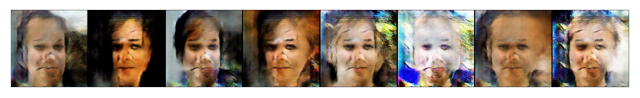

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 7.5807, loss_d: 0.1879, real_score: 0.9502, fake_score: 0.0485


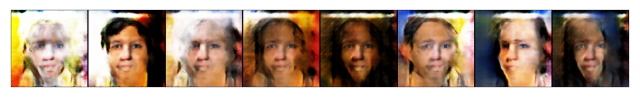

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 6.9201, loss_d: 0.0759, real_score: 0.9685, fake_score: 0.0315


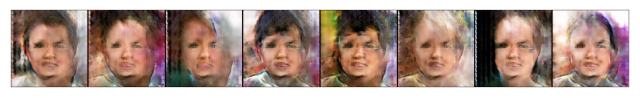

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 7.1034, loss_d: 0.0761, real_score: 0.9699, fake_score: 0.0282


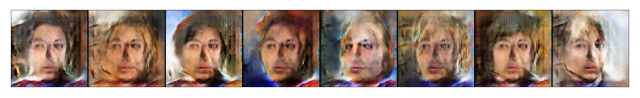

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 8.3345, loss_d: 0.1342, real_score: 0.9611, fake_score: 0.0413


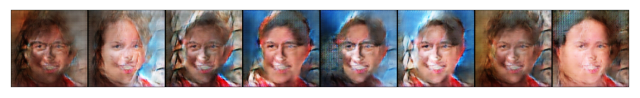

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 7.6886, loss_d: 0.0773, real_score: 0.9690, fake_score: 0.0303


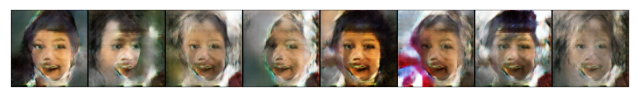

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 7.9949, loss_d: 0.1359, real_score: 0.9599, fake_score: 0.0378


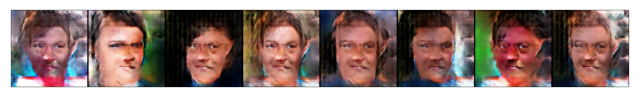

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 7.5027, loss_d: 0.0825, real_score: 0.9683, fake_score: 0.0290


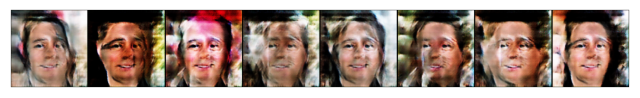

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 7.8277, loss_d: 0.1794, real_score: 0.9568, fake_score: 0.0481


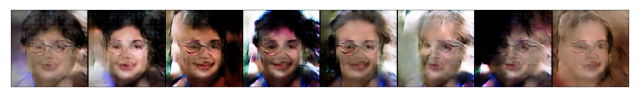

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 7.5835, loss_d: 0.0811, real_score: 0.9680, fake_score: 0.0292


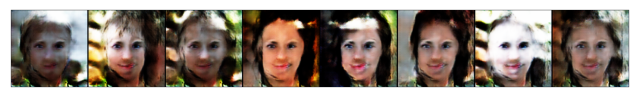

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 6.5081, loss_d: 0.0539, real_score: 0.9760, fake_score: 0.0228


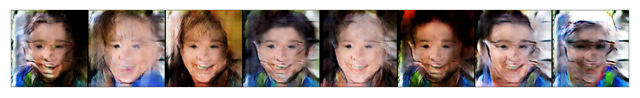

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 8.0437, loss_d: 0.1004, real_score: 0.9680, fake_score: 0.0329


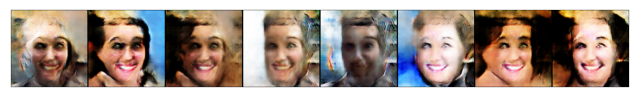

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 7.8637, loss_d: 0.1016, real_score: 0.9649, fake_score: 0.0337


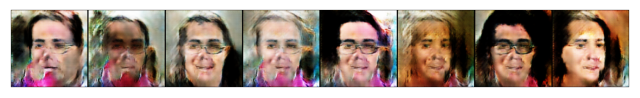

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 6.4038, loss_d: 0.0642, real_score: 0.9721, fake_score: 0.0241


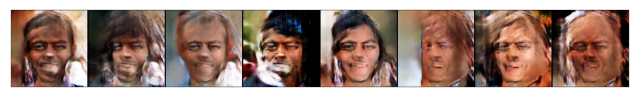

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 7.7757, loss_d: 0.1005, real_score: 0.9706, fake_score: 0.0332


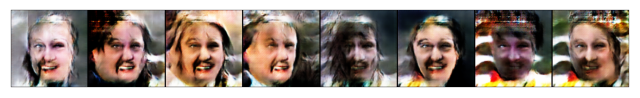

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 8.0915, loss_d: 0.1096, real_score: 0.9739, fake_score: 0.0319


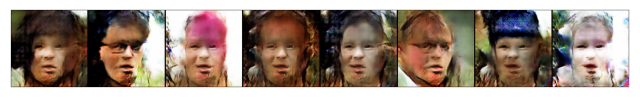

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 7.9282, loss_d: 0.2143, real_score: 0.9466, fake_score: 0.0441


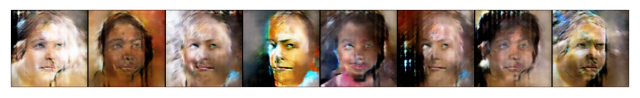

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 7.7413, loss_d: 0.1030, real_score: 0.9659, fake_score: 0.0368


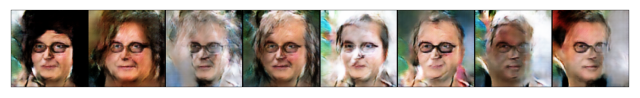

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 6.4478, loss_d: 0.0635, real_score: 0.9729, fake_score: 0.0260


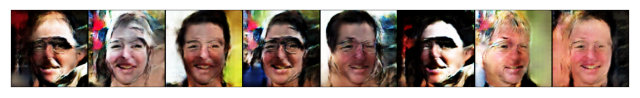

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 7.5949, loss_d: 0.1622, real_score: 0.9549, fake_score: 0.0447


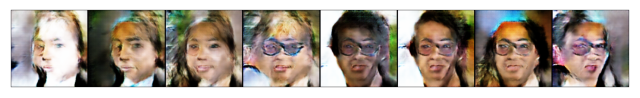

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 8.2457, loss_d: 0.1591, real_score: 0.9568, fake_score: 0.0450


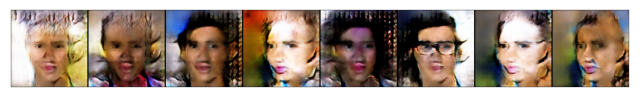

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 7.3591, loss_d: 0.0723, real_score: 0.9719, fake_score: 0.0278


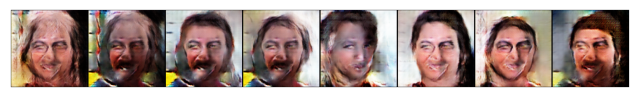

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 8.1984, loss_d: 0.0788, real_score: 0.9719, fake_score: 0.0274


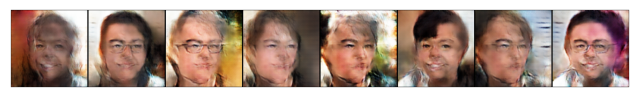

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 6.7948, loss_d: 0.0573, real_score: 0.9749, fake_score: 0.0236


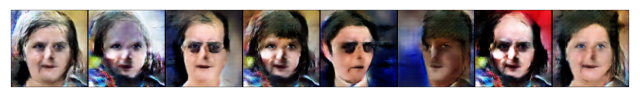

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 8.3609, loss_d: 0.2125, real_score: 0.9505, fake_score: 0.0507


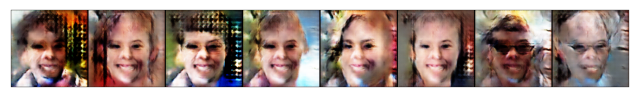

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 7.7211, loss_d: 0.0689, real_score: 0.9743, fake_score: 0.0261


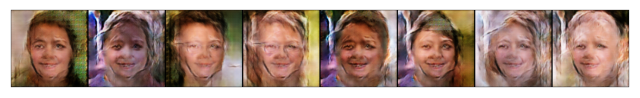

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 10.1264, loss_d: 0.1102, real_score: 0.9646, fake_score: 0.0351


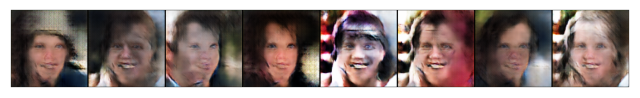

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 7.8476, loss_d: 0.0654, real_score: 0.9734, fake_score: 0.0253


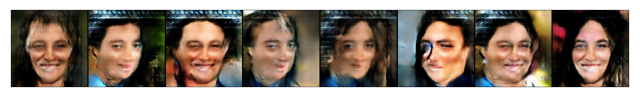

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 9.6532, loss_d: 0.1800, real_score: 0.9537, fake_score: 0.0443


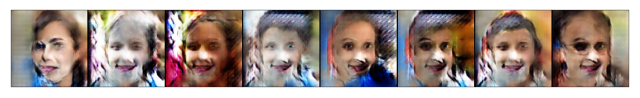

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 8.6527, loss_d: 0.0942, real_score: 0.9667, fake_score: 0.0333


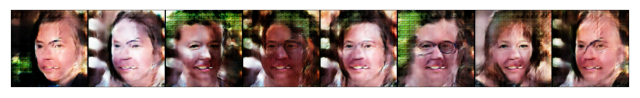

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 8.6557, loss_d: 0.1020, real_score: 0.9675, fake_score: 0.0322


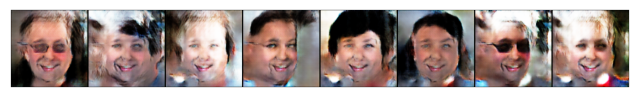

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 6.6432, loss_d: 0.1321, real_score: 0.9732, fake_score: 0.0320


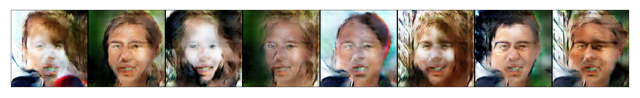

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 5.8129, loss_d: 0.0589, real_score: 0.9740, fake_score: 0.0240


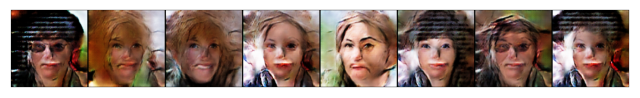

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 5.7160, loss_d: 0.0475, real_score: 0.9781, fake_score: 0.0209


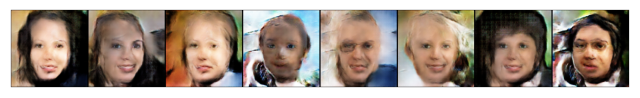

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 5.8156, loss_d: 0.0446, real_score: 0.9790, fake_score: 0.0189


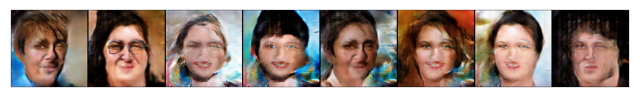

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 5.6955, loss_d: 0.0543, real_score: 0.9753, fake_score: 0.0192


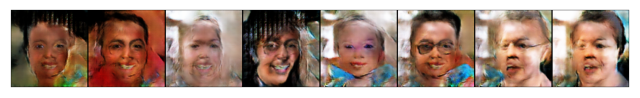

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 6.9468, loss_d: 0.0985, real_score: 0.9742, fake_score: 0.0286


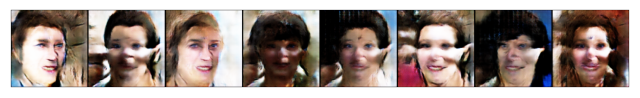

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 6.4659, loss_d: 0.0393, real_score: 0.9845, fake_score: 0.0188


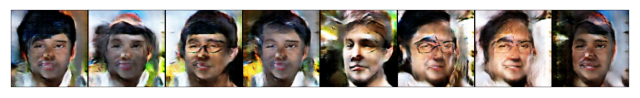

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 6.4968, loss_d: 0.0367, real_score: 0.9839, fake_score: 0.0151


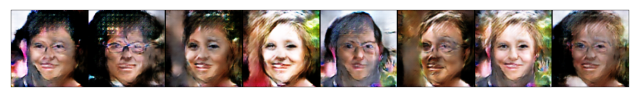

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 6.3814, loss_d: 0.0341, real_score: 0.9851, fake_score: 0.0148


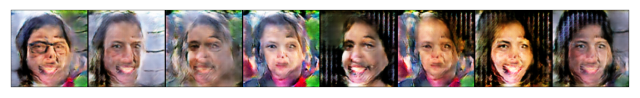

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 7.0505, loss_d: 0.0359, real_score: 0.9844, fake_score: 0.0151


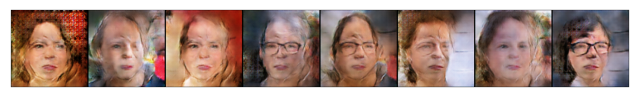

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 7.7467, loss_d: 0.0450, real_score: 0.9832, fake_score: 0.0175


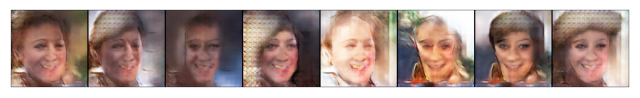

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 7.2608, loss_d: 0.0332, real_score: 0.9856, fake_score: 0.0131


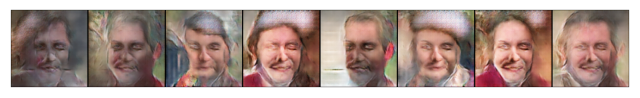

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 7.8888, loss_d: 0.0367, real_score: 0.9843, fake_score: 0.0136


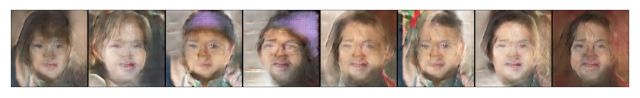

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 8.8930, loss_d: 0.0897, real_score: 0.9789, fake_score: 0.0242


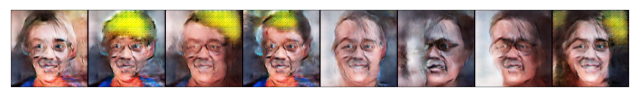

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 8.5226, loss_d: 0.0473, real_score: 0.9837, fake_score: 0.0166


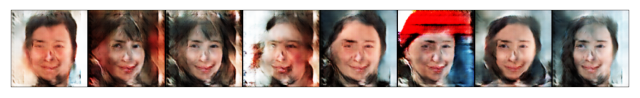

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 7.9080, loss_d: 0.0413, real_score: 0.9838, fake_score: 0.0151


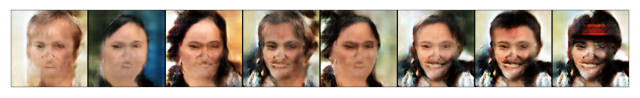

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 8.2641, loss_d: 0.0336, real_score: 0.9862, fake_score: 0.0142


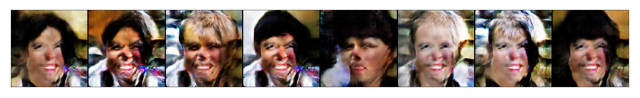

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 6.8343, loss_d: 0.0292, real_score: 0.9867, fake_score: 0.0115


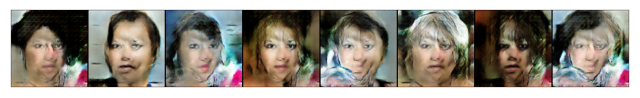

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 7.0219, loss_d: 0.0285, real_score: 0.9876, fake_score: 0.0126


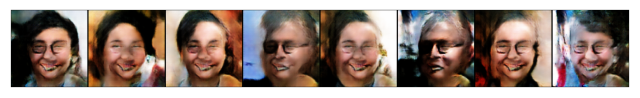

  0%|          | 0/99 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 7.1182, loss_d: 0.0281, real_score: 0.9878, fake_score: 0.0121


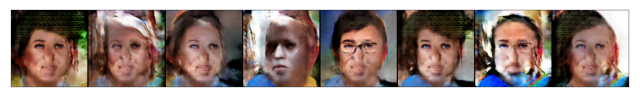

Saving generated-images-0100.png


In [31]:
history = train(model, train_loader, criterion, lr, epochs)

In [73]:
def handle_history(history):
    sns.set(style='whitegrid', font_scale=1.4)
    
    losses_g, losses_d, real_scores, fake_scores = history

    fig, axs = plt.subplots(2, figsize=(10, 8))
    plt.tight_layout()

    axs[0].plot(losses_g, label='generator')
    axs[0].plot(losses_d, label='discriminator')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    axs[0].legend()

    axs[1].plot(real_scores, label='real')
    axs[1].plot(fake_scores, label='fake')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Score')
    axs[1].legend()

    plt.show()

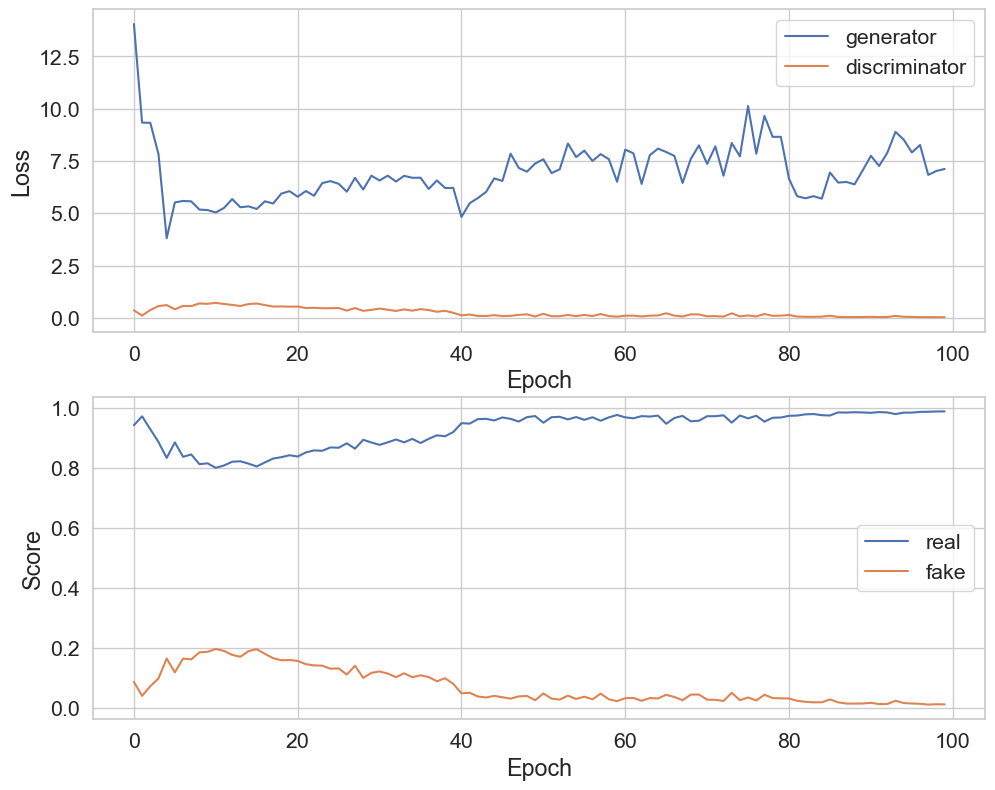

In [74]:
handle_history(history)

График соответсвует теоретическим представлениям: сначала лосс генератора падает, а потом начинает возрастать, с дискриминатором $-$ наоборот. Можно заметить, что уже на 4 эпохе генератор выдаёт изображения, по форме похожие на лица, но дискриминатор к этому моменту ещё не научился хорошо распознавать реальные изображения от сгенерированных.

Под конец обучения дискриминатор почти идеально распознаёт, была сгенерирована картинка или нет, из датасета ли она.

## Часть 3. Генерация изображений (1 балл)

Теперь давайте оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором

Saving generated-images-0001.png


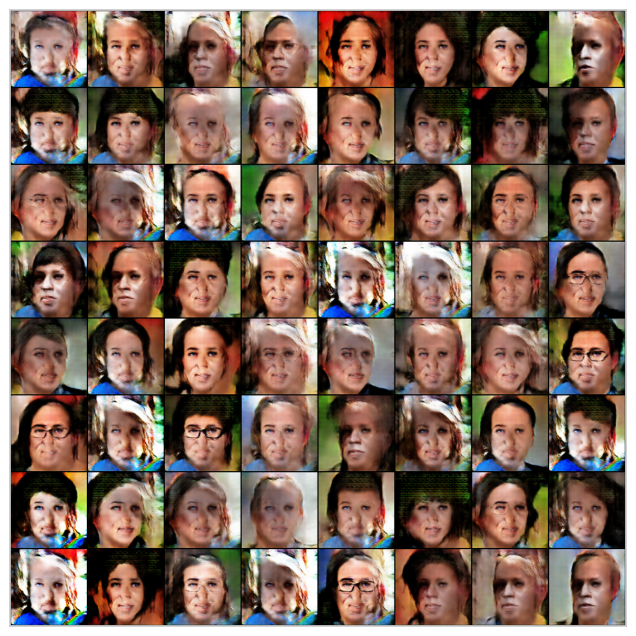

In [76]:
generator.eval()
save_samples(1, fixed_latent, show=True)

Генератор научился воспроизводить основные черты лица, однако присутствует множество артефактов.

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

In [201]:
n_batches = 15

In [202]:
# n_images = len(os.listdir(DATA_DIR + 'faces_dataset_small'))
n_images = n_batches * batch_size

In [204]:
fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model["generator"](fixed_latent)
fake_targets = torch.squeeze(torch.zeros(n_images, 1, device=device))

In [205]:
fake_images.shape

torch.Size([480, 3, 128, 128])

In [206]:
real_images = None
for X, _ in train_loader:
    if real_images is None:
        real_images = X
    else:
        real_images = torch.cat((real_images, X))
    if len(real_images) == n_images:
        break

In [207]:
real_images.shape

torch.Size([480, 3, 128, 128])

In [208]:
real_targets = torch.squeeze(torch.ones(n_images, 1, device=device))

In [209]:
real_targets.shape

torch.Size([480])

In [210]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [211]:
mixed_images = torch.cat((real_images.flatten(start_dim=1), fake_images.flatten(start_dim=1))).detach().cpu()
mixed_targets = torch.cat((real_targets, fake_targets)).detach().cpu()

In [212]:
from sklearn.neighbors import KNeighborsClassifier

classifier = KNeighborsClassifier(n_neighbors=1)

In [213]:
from sklearn.model_selection import LeaveOneOut

loo = LeaveOneOut()
score = 0
for i, (train_index, test_index) in tqdm(enumerate(loo.split(mixed_images))):
    classifier = KNeighborsClassifier(n_neighbors=1)
    classifier.fit(mixed_images[train_index], mixed_targets[train_index])
    score += classifier.predict(mixed_images[test_index])[0] == mixed_targets[test_index]

0it [00:00, ?it/s]

In [216]:
print('accuracy: ', score / len(mixed_images))

accuracy:  tensor([0.8635])


Мы бы хотели получить скор около 0.5, который означал бы, что независимому классификатору 1-NN сложно отличить сгенерированные изображения от реальных. Однако скор равен 0.86, что и следовало ожидать, поскольку генерируемые изображения действительно оставляют желать лучшего.

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

In [223]:
from sklearn.manifold import TSNE
import pandas as pd

In [220]:
tsne = TSNE(n_components=2, verbose=1, random_state=42)
z = tsne.fit_transform(mixed_images) 

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 960 samples in 0.040s...
[t-SNE] Computed neighbors for 960 samples in 1.050s...
[t-SNE] Computed conditional probabilities for sample 960 / 960
[t-SNE] Mean sigma: 34.510434
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.961388
[t-SNE] KL divergence after 1000 iterations: 1.491903


C:\Users\Vlad\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Vlad\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Vlad\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Vlad\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categor

[Text(0.5, 1.0, 'T-SNE projection')]

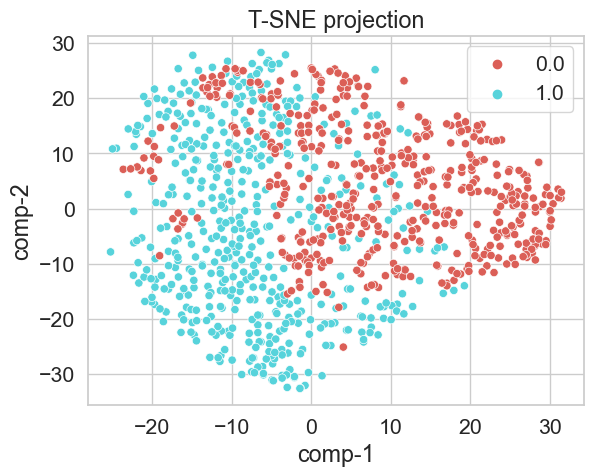

In [224]:
df = pd.DataFrame()
df["y"] = mixed_targets
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 2),
                data=df).set(title="T-SNE projection") 

Как и следовало ожидать из-за большого значения accuracy, сгенерированные и реальные изображения сильно отличаются друг от друга. Однако в новом пространстве всё же есть область, где фичи пересекаются.

P.S.
1. При обучении GAN'а необходимо подбирать размер батча, learning rate'а, использовать различные шедулеры
2. С нормализацией картинок генерируемые изображения значительно отличаются, чем при обучении GAN'а на картинках без нормализации
3. Возможно для избавления от артифактов в качестве регуляризации стоит добавить слои дропаута